<a href="https://colab.research.google.com/github/Amal642/Amal642/blob/main/Train_and_Detect_Mitosis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
   #raise SystemError('GPU device not found')
   print('GPU device not found')
print('Found GPU at: {}'.format(device_name))
print(tf.__version__)

GPU device not found
Found GPU at: 
1.15.2


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#%cp -r /content/gdrive/MyDrive/basil/Stuffs/json_to_pascal_voc/voc_dataset1/JPEGImages/* /content/gdrive/MyDrive/Amal/tensorflow/models/research/object_detection/images/train/

In [ ]:
#%cd /content/gdrive/MyDrive/Amal/tensorflow/models/research/object_detection
#!python xml_to_csv.py

In [ ]:
#%cp -r /content/gdrive/MyDrive/basil/Stuffs/json_to_pascal_voc/voc_dataset2/JPEGImages/* /content/gdrive/MyDrive/Amal/tensorflow/models/research/object_detection/images/train

In [ ]:
%cd '/content/gdrive/My Drive/Amal/tensorflow/'

/content/gdrive/My Drive/Amal/tensorflow


In [ ]:
!apt-get install protobuf-compiler python-pil python-lxml python-tk
!pip install Cython

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
python-lxml is already the newest version (4.2.1-1ubuntu0.6).
python-pil is already the newest version (5.1.0-1ubuntu0.7).
python-tk is already the newest version (2.7.17-1~18.04).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd /content/gdrive/My Drive//Amal/tensorflow/models/research/
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/My Drive/Amal/tensorflow/models/research


In [ ]:
import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/Amal/tensorflow/models/research/:/content/gdrive/My Drive/Desktop/models/research/slim'

In [ ]:
!python setup.py build
!python setup.py install

running build
running build_py
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/bipartite_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/center_net_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/calibration_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/flexible_grid_anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> 

In [ ]:
!pip install tensorflow.io

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd /content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection/builders/
!python model_builder_test.py

/content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection/builders
Using TensorFlow backend.


In [ ]:
%cd /content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection

/content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection


In [ ]:
!python generate_tfrecord.py --csv_input=images/train_labels.csv --image_dir=images/train --output_path=train.record



W0629 01:06:27.251379 140528748357504 module_wrapper.py:139] From generate_tfrecord.py:99: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0629 01:06:27.313720 140528748357504 module_wrapper.py:139] From generate_tfrecord.py:57: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/gdrive/MyDrive/Amal/tensorflow/models/research/object_detection/train.record


In [ ]:
!python generate_tfrecord.py --csv_input=images/test_labels.csv --image_dir=images/test --output_path=test.record



W0629 01:06:31.807183 140712258287488 module_wrapper.py:139] From generate_tfrecord.py:99: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0629 01:06:31.827695 140712258287488 module_wrapper.py:139] From generate_tfrecord.py:57: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection/test.record


In [ ]:
import pandas as pd
cd=pd.read_csv("/content/gdrive/MyDrive/Amal/tensorflow/models/research/object_detection/images/train_labels.csv",index_col=False)
cd.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,s15_376c_colorpng.jpg,5652,6067,Normal,4056,2589,4283,2853
1,s15_376c_colorpng.jpg,5652,6067,Normal,4320,1380,4538,1626
2,s15_376c_colorpng.jpg,5652,6067,Normal,4338,835,4483,1035
3,s15_376c_colorpng.jpg,5652,6067,Normal,4883,853,5065,1080
4,s15_376c_colorpng.jpg,5652,6067,Normal,2456,3107,2692,3344


In [ ]:
!pip uninstall opencv-python-headless==4.5.5.62
!pip install opencv-python-headless==4.5.2.52

Found existing installation: opencv-python-headless 4.5.2.52
Uninstalling opencv-python-headless-4.5.2.52:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.2.52.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-8daa01ff.so.58.109.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-06a336f2.so.58.61.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-01d48d95.so.56.60.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-098682aa.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libpng15-c2ffaf3d.so.15.13.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libssl-f3db6a3b.so.1.1
    /usr/local/lib/python3.7/dist-package

In [ ]:
!pip install -U numpy==1.18.5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip uninstall pycocotools
!pip install pycocotools --no-binary pycocotools

Found existing installation: pycocotools 2.0.4
Uninstalling pycocotools-2.0.4:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/pycocotools-2.0.4.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pycocotools/*
Proceed (y/n)? y
  Successfully uninstalled pycocotools-2.0.4
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 106 kB 5.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.4-cp37-cp37m-linux_x86_64.whl size=265216 sha256=fe1088cd122e9c11151843c48867f8963ef575c69d6f4d0aef6bde245268eebc
  Stored in directory: /root/.cache/pip/wheels/a3/5f/fa/f011e578cc76e1fc5be8dce30b3eb9fd00f337e744b3bba59b
Successfully built pycocotools


In [ ]:
#!python model_main.py --logtostderr --train_dir=training/ --pipeline_config_path=training/faster_rcnn_inception_v2_pets.config

In [ ]:
#%cp -av "/tmp/tmp8ihev5qx/" "/content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection/training/model_sputum/tmp2ig8flio/model.ckpt-14785.meta"

In [ ]:
#!python export_inference_graph.py --input_type image_tensor --pipeline_config_path training/faster_rcnn_inception_v2_pets.config --trained_checkpoint_prefix training/model_sputum/tmp2ig8flio/model.ckpt-14785 --output_directory inference_graph

/content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection
/content/gdrive/My Drive/Amal/tensorflow/models/research/object_detection/Sputum1_colorpng4.png


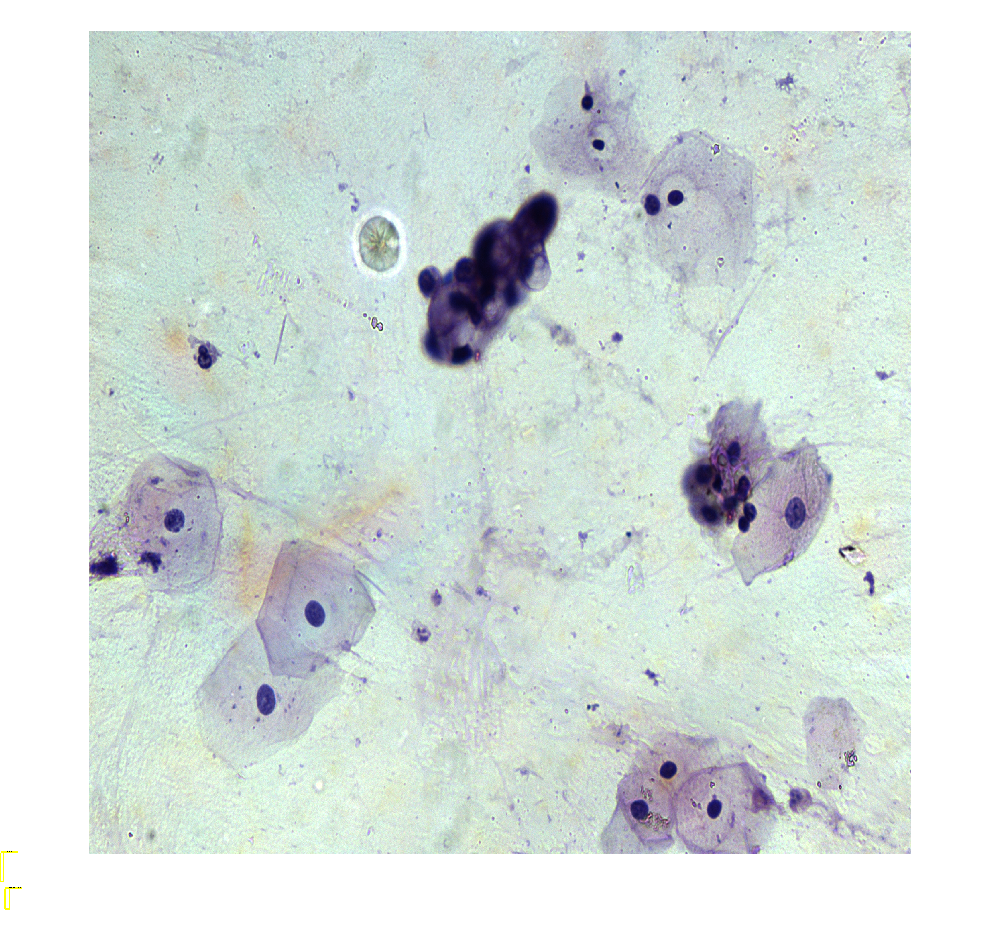

In [ ]:
######## Image Object Detection Using Tensorflow-trained Classifier #########

# Import packages
import os
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import tensorflow as tf
import sys

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

# Import utilites
from utils import label_map_util
from utils import visualization_utils as vis_util

# Name of the directory containing the object detection module we're using
MODEL_NAME = 'inference_graph'
IMAGE_NAME = 'Sputum1_colorpng4.png'

# Grab path to current working directory
CWD_PATH = os.getcwd()
print(CWD_PATH)

# Path to frozen detection graph .pb file, which contains the model that is used
# for object detection.
PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')

# Path to label map file
PATH_TO_LABELS = os.path.join(CWD_PATH,'training','labelmap.pbtxt')

# Path to image
PATH_TO_IMAGE = os.path.join(CWD_PATH,IMAGE_NAME)
print(PATH_TO_IMAGE)

# Number of classes the object detector can identify
NUM_CLASSES = 3

# Load the label map.
# Label maps map indices to category names, so that when our convolution
# network predicts `5`, we know that this corresponds to `king`.
# Here we use internal utility functions, but anything that returns a
# dictionary mapping integers to appropriate string labels would be fine
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

# Load the Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

    sess = tf.Session(graph=detection_graph)

# Define input and output tensors (i.e. data) for the object detection classifier

# Input tensor is the image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, and classes
# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')

# Load image using OpenCV and
# expand image dimensions to have shape: [1, None, None, 3]
# i.e. a single-column array, where each item in the column has the pixel RGB value
image = cv2.imread(PATH_TO_IMAGE)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)



# Perform the actual detection by running the model with the image as input
(boxes, scores, classes, num) = sess.run(
    [detection_boxes, detection_scores, detection_classes, num_detections],
    feed_dict={image_tensor: image_expanded})

# Draw the results of the detection (aka 'visulaize the results')

vis_util.visualize_boxes_and_labels_on_image_array(
    image,
    np.squeeze(boxes),
    np.squeeze(classes).astype(np.int32),
    np.squeeze(scores),
    category_index,
    use_normalized_coordinates=True,
    line_thickness=8,
    min_score_thresh=0.0000000000000001)

# All the results have been drawn on image. Now display the image.
cv2_imshow(image)

# Press any key to close the image
#cv2.waitKey(0)

# Clean up
#cv2.destroyAllWindows()


In [ ]:
print(np.squeeze(classes).astype(np.int32),
    np.squeeze(scores))

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1] [1.3538280e-16 1.2007618e-16 7.2233084e-17 3.3822436e-17 2.8225120e-17
 2.1621641e-17 1.4621286e-17 6.7778282e-18 6.2949214e-18 5.4750923e-18
 4.2492946e-18 3.7009037e-18 2.4527448e-18 2.1926627e-18 2.1873995e-18
 2.0047913e-18 1.9900475e-18 1.9870663e-18 1.9704449e-18 1.8812519e-18
 1.8578317e-18 1.8397419e-18 1.7929407e-18 1.7354326e-18 1.6533671e-18
 1.6433376e-18 1.5586312e-18 1.5235

In [ ]:
'''#Data Augmentation using keras

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

# FOR LOOP needs to be given here
img = load_img('/content/gdrive/MyDrive/Sputum Images/20/Spnew5_colorpng.png')  # this is a PIL image

x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

# the .flow() command below generates batches of randomly transformed images
# and saves the results to the `preview/` directory
i = 0
for batch in datagen.flow(x, batch_size=1,
                          save_to_dir='/content/gdrive/MyDrive/Sputum Images/GAN/', save_prefix='aug', save_format='jpg'):
    i += 1
    if i > 5:
        break  # otherwise the generator would loop indefinitely'''
 

"#Data Augmentation using keras\n\nfrom keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img\n\ndatagen = ImageDataGenerator(\n        rotation_range=40,\n        width_shift_range=0.2,\n        height_shift_range=0.2,\n        shear_range=0.2,\n        zoom_range=0.2,\n        horizontal_flip=True,\n        fill_mode='nearest')\n\n# FOR LOOP needs to be given here\nimg = load_img('/content/gdrive/MyDrive/Sputum Images/20/Spnew5_colorpng.png')  # this is a PIL image\n\nx = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)\nx = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)\n\n# the .flow() command below generates batches of randomly transformed images\n# and saves the results to the `preview/` directory\ni = 0\nfor batch in datagen.flow(x, batch_size=1,\n                          save_to_dir='/content/gdrive/MyDrive/Sputum Images/GAN/', save_prefix='aug', save_format='jpg'):\n    i += 1\n    if i > 5